In [4]:
import pandas as pd
import tensorflow
import tensorflow.keras as keras
import numpy as np
import matplotlib.pyplot as plt

from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split

from imblearn.over_sampling import SMOTE, RandomOverSampler

from keras.callbacks import ModelCheckpoint

import ast
import nltk

from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences

from tqdm import tqdm
tqdm.pandas()

import pickle

In [5]:
#시드 고정
import random
random.seed(42)
np.random.seed(42)
tensorflow.random.set_seed(42)

In [6]:
# from google.colab import drive
# drive.mount('/content/drive')

Mounted at /content/drive


In [7]:
# path= '/content/drive/MyDrive/election/'
path = '../data/'
LDA = True
orig_filename = f'{path}processed_text_features{'_LDA' if LDA else ''}.csv'
orig_filename_2024 = f'{path}processed_2024_text_features{'_LDA' if LDA else ''}.csv'

In [ ]:
text_df.to_csv(path+orig_filename, index_col=0)
recent_df.to_csv(path+orig_filename_2024, index_col=0)

In [ ]:
# Load Data

with open(path+'train_x.pkl','rb') as f:
  social_train_x = pickle.load(f)

with open(path+'train_y.pkl','rb') as f:
  social_train_y = pickle.load(f)

with open(path+'valid_x.pkl','rb') as f:
  social_valid_x = pickle.load(f)

with open(path+'valid_y.pkl','rb') as f:
  social_valid_y = pickle.load(f)

with open(path+'test_x.pkl','rb') as f:
  social_test_x = pickle.load(f)

with open(path+'test_y.pkl','rb') as f:
  social_test_y = pickle.load(f)

## 주제별 Importance 사용한 예측 모델

In [137]:
if LDA:
       importance_columns = ['Year',
       'economy_importance',
       'justice_importance', 'education_importance',
       'military_importance', 'ideal_importance', 'elected']
else:
       importance_columns = ['Year', 'environment_importance',
       'economy_importance', 'diplomacy_importance', 'immigration_importance',
       'justice_importance', 'education_importance', 'Healthcare_importance',
       'military_importance', 'ideal_importance', 'elected']



train_importance_df, valid_importance_df = train_test_split(text_df[importance_columns], test_size=0.2, random_state=42)


# train_importance_df = train_df[['Year', 'environment_importance',
#        'economy_importance', 'diplomacy_importance', 'immigration_importance',
#        'justice_importance', 'education_importance', 'Healthcare_importance',
#        'military_importance', 'ideal_importance', 'elected']]

# valid_importance_df = valid_df[['Year', 'environment_importance',
#        'economy_importance', 'diplomacy_importance', 'immigration_importance',
#        'justice_importance', 'education_importance', 'Healthcare_importance',
#        'military_importance', 'ideal_importance', 'elected']]

test_importance_df = recent_df[importance_columns]

In [138]:
# train_importance_df.to_csv(path+'train_importance_data.csv')
# valid_importance_df.to_csv(path+'valid_importance_data.csv')
# test_importance_df.to_csv(path+'test_importance_data.csv')


In [139]:
importance_train_x_df = train_importance_df.drop('elected',axis=1)
importance_train_y_df = train_importance_df['elected']

importance_valid_x_df = valid_importance_df.drop('elected',axis=1)
importance_valid_y_df = valid_importance_df['elected']

importance_test_x_df = test_importance_df.drop('elected',axis=1)
importance_test_y_df = test_importance_df['elected']

In [140]:
importance_scaler = MinMaxScaler()
importance_train_x = importance_scaler.fit_transform(importance_train_x_df)
importance_valid_x = importance_scaler.transform(importance_valid_x_df)

importance_test_x = importance_scaler.transform(importance_test_x_df)

importance_train_y = np.array(importance_train_y_df)
importance_valid_y = np.array(importance_valid_y_df)
importance_test_y = np.array(importance_test_y_df)

In [141]:
#hyperparameters

lr = 1e-3
dropout_p = 0.5
num_epochs = 200

In [142]:
def get_importance_model(num_features,hidden_layers=[64]):
  input = keras.layers.Input(num_features)
  x = keras.layers.Dense(128,activation='relu')(input)
  x = keras.layers.Dropout(dropout_p)(x)
  # x = keras.layers.Dense(64,activation='relu')(input)
  if hidden_layers:
    for layer in hidden_layers:
      x = keras.layers.Dense(layer, activation='relu')(x)
  # x = keras.layers.Dropout(dropout_p)
  output = keras.layers.Dense(1,activation='sigmoid')(x)

  return keras.Model(input,output)

In [143]:
importance_features = 10 if LDA else 6
importance_model = get_importance_model(importance_features)
importance_model.summary()

Model: "model_11"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_9 (InputLayer)        [(None, 10)]              0         
                                                                 
 dense_10 (Dense)            (None, 128)               1408      
                                                                 
 dropout_3 (Dropout)         (None, 128)               0         
                                                                 
 dense_11 (Dense)            (None, 64)                8256      
                                                                 
 dense_12 (Dense)            (None, 1)                 65        
                                                                 
Total params: 9729 (38.00 KB)
Trainable params: 9729 (38.00 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [144]:
importance_extractor =  keras.Model(importance_model.input, importance_model.layers[-2].output)

In [145]:
def compile(model,optimizer='adam',loss='binary_crosentropy'):
  model.compile(loss='binary_crossentropy', optimizer=optimizer, metrics=['accuracy'])
  return

compile(importance_model,optimizer=keras.optimizers.Adam(learning_rate=lr))

def run(model, train_x, train_y, valid_x=None, valid_y=None, path='./best_model.h5', epoch_num=10):
  checkpoint = ModelCheckpoint(filepath=path, save_weights_only=True, monitor='val_accuracy', save_best_only=True)
  if valid_x is not None and valid_y is not None:
    hist = model.fit(train_x, train_y, epochs=epoch_num, validation_data=(valid_x,valid_y), callbacks=[checkpoint])
  else:
    hist = model.fit(train_x, train_y, epochs=epoch_num)
  return hist


importance_hist = run(importance_model, importance_train_x, importance_train_y, importance_valid_x, importance_valid_y, path='best_importance.h5', epoch_num=num_epochs)

Epoch 1/200
85/85 [==============================] - 2s 6ms/step - loss: 0.6807 - accuracy: 0.5900 - val_loss: 0.6714 - val_accuracy: 0.6059
Epoch 2/200
85/85 [==============================] - 0s 6ms/step - loss: 0.6740 - accuracy: 0.5937 - val_loss: 0.6619 - val_accuracy: 0.6059
Epoch 3/200
85/85 [==============================] - 0s 6ms/step - loss: 0.6682 - accuracy: 0.5974 - val_loss: 0.6605 - val_accuracy: 0.6206
Epoch 4/200
85/85 [==============================] - 1s 6ms/step - loss: 0.6644 - accuracy: 0.5992 - val_loss: 0.6551 - val_accuracy: 0.6176
Epoch 5/200
85/85 [==============================] - 0s 6ms/step - loss: 0.6627 - accuracy: 0.5929 - val_loss: 0.6547 - val_accuracy: 0.6103
Epoch 6/200
85/85 [==============================] - 1s 6ms/step - loss: 0.6615 - accuracy: 0.5948 - val_loss: 0.6543 - val_accuracy: 0.6206
Epoch 7/200
85/85 [==============================] - 1s 6ms/step - loss: 0.6591 - accuracy: 0.5944 - val_loss: 0.6502 - val_accuracy: 0.6132
Epoch 8/200
8

## 텍스트 사용 모델

In [125]:
text_columns = ["speech_divide_to_10","elected"]

train_text_df, valid_text_df = train_test_split(text_df[text_columns], test_size=0.2, random_state=42)
test_text_df = recent_df[text_columns]

In [126]:
def sections_to_data(df):
  data = list()
  for row in df.values:
    for section in row[0]:
      data.append({"section": section, "elected": row[1]})
  # print(data)
  return pd.DataFrame(data)

In [127]:
train_text_df = sections_to_data(train_text_df)
valid_text_df = sections_to_data(valid_text_df)
test_text_df = sections_to_data(test_text_df)

train_text_x_df = train_text_df["section"]
valid_text_x_df = valid_text_df["section"]
test_text_x_df = test_text_df["section"]

train_text_y_df = train_text_df["elected"]
valid_text_y_df = valid_text_df["elected"]
test_text_y_df = test_text_df["elected"]

In [128]:
train_text_df.to_csv(path+'train_text_data.csv')
valid_text_df.to_csv(path+'valid_text_data.csv')
test_text_df.to_csv(path+'test_text_data.csv')

In [129]:
text_train_y = np.array(train_text_y_df)
text_valid_y = np.array(valid_text_y_df)
text_test_y = np.array(test_text_y_df)

In [130]:
result = list()
for lst in train_text_x_df.values:
  result+=lst
result = set(result)

len(result)

39143

In [131]:
# train set엔 기본적으로 39143개
max_vocab_size = 40000

tokenizer = Tokenizer(num_words = max_vocab_size)
tokenizer.fit_on_texts(train_text_x_df)

train_sequences = tokenizer.texts_to_sequences(train_text_x_df)
valid_sequences = tokenizer.texts_to_sequences(valid_text_x_df)
test_sequences = tokenizer.texts_to_sequences(test_text_x_df)

train_padded_sequences = pad_sequences(train_sequences, maxlen=100)
valid_padded_sequences = pad_sequences(valid_sequences, maxlen=100)
test_padded_sequences = pad_sequences(test_sequences, maxlen=100)

In [132]:
def get_text_model(timestep, hidden_layers=None):
  input = keras.layers.Input(shape=(timestep,))
  x = keras.layers.Embedding(max_vocab_size, 128, input_length=100)(input)
  x = keras.layers.LSTM(64)(x)
  if hidden_layers:
    for layer in hidden_layers:
      x = keras.layers.Dense(layer, activation='relu')(x)
  output = keras.layers.Dense(1, activation='sigmoid')(x)
  return keras.Model(input, output)

In [133]:
text_model = get_text_model(100)
text_model.summary()

Model: "model_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_8 (InputLayer)        [(None, 100)]             0         
                                                                 
 embedding_1 (Embedding)     (None, 100, 128)          5120000   
                                                                 
 lstm_1 (LSTM)               (None, 64)                49408     
                                                                 
 dense_9 (Dense)             (None, 1)                 65        
                                                                 
Total params: 5169473 (19.72 MB)
Trainable params: 5169473 (19.72 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [134]:
text_extractor = keras.Model(text_model.input, text_model.layers[-2].output)

In [135]:
text_model.compile(optimizer='adam',loss='binary_crossentropy',metrics=['accuracy'])

In [136]:
num_epochs = 20


def run(model, train_x, train_y, valid_x=None, valid_y=None, path='./best_model.h5', epoch_num=10):
  checkpoint = ModelCheckpoint(filepath=path, save_weights_only=True, monitor='val_accuracy', save_best_only=True)
  if valid_x is not None and valid_y is not None:
    hist = model.fit(train_x, train_y, epochs=epoch_num, validation_data=(valid_x,valid_y), callbacks=[checkpoint])
  else:
    hist = model.fit(train_x, train_y, epochs=epoch_num)
  return hist

text_hist = run(text_model, train_padded_sequences, text_train_y, valid_padded_sequences,text_valid_y, path='best_text.h5', epoch_num=num_epochs)

Epoch 1/20
834/834 [==============================] - 39s 42ms/step - loss: 0.4176 - accuracy: 0.8076 - val_loss: 0.4351 - val_accuracy: 0.8304
Epoch 2/20
834/834 [==============================] - 12s 14ms/step - loss: 0.1990 - accuracy: 0.9248 - val_loss: 0.3964 - val_accuracy: 0.8391
Epoch 3/20
834/834 [==============================] - 10s 12ms/step - loss: 0.1106 - accuracy: 0.9595 - val_loss: 0.4842 - val_accuracy: 0.8352
Epoch 4/20
834/834 [==============================] - 8s 10ms/step - loss: 0.0640 - accuracy: 0.9774 - val_loss: 0.6812 - val_accuracy: 0.8257
Epoch 5/20
834/834 [==============================] - 9s 11ms/step - loss: 0.0406 - accuracy: 0.9868 - val_loss: 0.6682 - val_accuracy: 0.8232
Epoch 6/20
834/834 [==============================] - 8s 9ms/step - loss: 0.0339 - accuracy: 0.9885 - val_loss: 0.8126 - val_accuracy: 0.8262
Epoch 7/20
834/834 [==============================] - 8s 10ms/step - loss: 0.0234 - accuracy: 0.9922 - val_loss: 0.9194 - val_accuracy: 0.81

## 사회적 지표 사용 모델

In [113]:
ind = 'ind_'

with open(path+ind+'train_x.pkl','rb') as f:
  social_train_x = pickle.load(f)

with open(path+ind+'train_y.pkl','rb') as f:
  social_train_y = pickle.load(f)

with open(path+ind+'valid_x.pkl','rb') as f:
  social_valid_x = pickle.load(f)

with open(path+ind+'valid_y.pkl','rb') as f:
  social_valid_y = pickle.load(f)

with open(path+ind+'test_x.pkl','rb') as f:
  social_test_x = pickle.load(f)

with open(path+ind+'test_y.pkl','rb') as f:
  social_test_y = pickle.load(f)

In [114]:
# getting rid of "Year" column for societal model
social_train_x = social_train_x[:,:,1:] 
social_valid_x = social_valid_x[:,:,1:]
social_test_x = social_test_x[:,:,1:]

In [115]:
social_train_x.shape

(44, 4, 10)

In [117]:
input_feature = 10  # 고정
dropout_p = 0.3
num_epochs = 50
lr = 1e-2
kernel_size = 4

In [118]:
def get_lstm_model(input_features, dropout_p, dense_layers=None):
    input = keras.layers.Input(shape=(4, input_features))
    x = keras.layers.LSTM(64, dropout=dropout_p)(input)
    if dense_layers:
        for i in dense_layers:
            x = keras.layers.Dense(i, activation='relu')(x)
    output = keras.layers.Dense(1, activation='sigmoid')(x)
    model = keras.Model(input, output)
    return model

def get_cnn_model(input_features, dropout_p, kernel_size, dense_layers=[64]):
    input = keras.layers.Input(shape=(4, input_features))
    x = keras.layers.Conv1D(filters=32, kernel_size=kernel_size, activation='relu')(input)
    x = keras.layers.Dropout(dropout_p)(x)
    if dense_layers:
        for i in dense_layers:
            x = keras.layers.Dense(i, activation='relu')(x)
    output = keras.layers.Dense(1, activation='sigmoid')(x)[:,:,0]
    model = keras.Model(input, output)
    return model

In [119]:
def compile_social_model(model,optimizer='adam',loss='binary_crosentropy'):
  model.compile(loss='binary_crossentropy', optimizer=optimizer, metrics=['accuracy'])
  return

def run_social_model(model, train_x, train_y, valid_x=None, valid_y=None, path='./best_social.h5', epoch_num=10):
  checkpoint = ModelCheckpoint(filepath=path, save_weights_only=True, monitor='val_accuracy', save_best_only=True)
  if valid_x is not None and valid_y is not None:
    hist = model.fit(train_x, train_y, epochs=epoch_num, validation_data=(valid_x, valid_y), callbacks=[checkpoint])
  else:
    hist = model.fit(train_x, train_y, epochs=epoch_num)
  return hist

In [120]:
social_model = get_cnn_model(input_feature, dropout_p, kernel_size)
# social_model = get_lstm_model(input_feature, dropout_p)

social_model.summary()

Model: "model_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_7 (InputLayer)        [(None, 4, 10)]           0         
                                                                 
 conv1d_1 (Conv1D)           (None, 1, 32)             1312      
                                                                 
 dropout_2 (Dropout)         (None, 1, 32)             0         
                                                                 
 dense_7 (Dense)             (None, 1, 64)             2112      
                                                                 
 dense_8 (Dense)             (None, 1, 1)              65        
                                                                 
 tf.__operators__.getitem_2  (None, 1)                 0         
  (SlicingOpLambda)                                              
                                                           

In [121]:
social_extractor = keras.Model(social_model.input, social_model.layers[-3].output)

In [122]:
compile_social_model(social_model,optimizer=keras.optimizers.Adam(learning_rate=lr))

In [123]:
social_hist = run_social_model(social_model, social_train_x, social_train_y, valid_x = social_valid_x, valid_y=social_valid_y, path='best_social.h5', epoch_num=num_epochs)

Epoch 1/50
2/2 [==============================] - 2s 342ms/step - loss: 0.7075 - accuracy: 0.4318 - val_loss: 0.6976 - val_accuracy: 0.5000
Epoch 2/50
2/2 [==============================] - 0s 45ms/step - loss: 0.6944 - accuracy: 0.5227 - val_loss: 0.6864 - val_accuracy: 0.5000
Epoch 3/50
2/2 [==============================] - 0s 62ms/step - loss: 0.6999 - accuracy: 0.5227 - val_loss: 0.6900 - val_accuracy: 0.5000
Epoch 4/50
2/2 [==============================] - 0s 69ms/step - loss: 0.6744 - accuracy: 0.5227 - val_loss: 0.6969 - val_accuracy: 0.6000
Epoch 5/50
2/2 [==============================] - 0s 60ms/step - loss: 0.6882 - accuracy: 0.5227 - val_loss: 0.7024 - val_accuracy: 0.4000
Epoch 6/50
2/2 [==============================] - 0s 61ms/step - loss: 0.6773 - accuracy: 0.6364 - val_loss: 0.7113 - val_accuracy: 0.5000
Epoch 7/50
2/2 [==============================] - 0s 56ms/step - loss: 0.6738 - accuracy: 0.5227 - val_loss: 0.7243 - val_accuracy: 0.5000
Epoch 8/50
2/2 [==========

In [124]:
social_model.predict(social_test_x)

1/1 [==============================] - 0s 104ms/step


array([[0.59628725],
       [0.01300681]], dtype=float32)

## Combined Model

### Load Merged Data

In [ ]:
train_df = pd.read_csv(path+'combined_train.csv', index_col=0)
valid_df = pd.read_csv(path+'combined_valid.csv', index_col=0)
test_df = pd.read_csv(path+'combined_test.csv', index_col=0)

### Set up Data

In [149]:
def sections_to_data(df):
  column_to_move = df.pop("speech_divide_to_10")
  df.insert(0, "speech_divide_to_10", column_to_move)

  data = list()
  for row in df.values:
    for section in row[0]:
      data_dict = {"section": section}
      for i in range(1,len(row)):
        data_dict[df.columns[i]] = row[i]
      data.append(data_dict)
  return pd.DataFrame(data)



In [150]:
train_df = sections_to_data(train_df)
valid_df = sections_to_data(valid_df)
test_df = sections_to_data(test_df)

KeyError: 'speech_divide_to_10'

In [ ]:
train_df["section_sequence"] = train_df["section"].apply(tokenizer.texts_to_sequences)
valid_df["section_sequence"] = valid_df["section"].apply(tokenizer.texts_to_sequences)#.apply(lambda x: pad_sequences([elem for lst in x for elem in lst], maxlen=100))
test_df["section_sequence"] = test_df["section"].apply(tokenizer.texts_to_sequences)#.apply(lambda x: pad_sequences([elem for lst in x for elem in lst], maxlen=100))

train_df["section_sequence"] = train_df["section_sequence"].apply(lambda x: [elem for lst in x for elem in lst])
valid_df["section_sequence"] = valid_df["section_sequence"].apply(lambda x: [elem for lst in x for elem in lst])
test_df["section_sequence"] = test_df["section_sequence"].apply(lambda x: [elem for lst in x for elem in lst])

In [ ]:
train_df["section_sequence"] = train_df["section_sequence"].apply(lambda x: pad_sequences([x],maxlen=100)[0])
valid_df["section_sequence"] = valid_df["section_sequence"].apply(lambda x: pad_sequences([x],maxlen=100)[0])
test_df["section_sequence"] = test_df["section_sequence"].apply(lambda x: pad_sequences([x],maxlen=100)[0])

In [ ]:
if LDA:
       importance_columns = ['Year',
       'economy_importance',
       'justice_importance', 'education_importance',
       'military_importance', 'ideal_importance']
else:
       importance_columns = ['Year', 'environment_importance',
       'economy_importance', 'diplomacy_importance', 'immigration_importance',
       'justice_importance', 'education_importance', 'Healthcare_importance',
       'military_importance', 'ideal_importance']


train_df[importance_columns] = importance_scaler.transform(train_df[importance_columns])
valid_df[importance_columns] = importance_scaler.transform(valid_df[importance_columns])
test_df[importance_columns] = importance_scaler.transform(test_df[importance_columns])

In [ ]:
social_columns = ['Approval_Rating', 'CPI', 'GDP', 'Employment status',
       'Final Education', 'Age', 'region_x',
       'region_y']

train_df[social_columns] = social_scaler.transform(train_df[social_columns])
valid_df[social_columns] = social_scaler.transform(valid_df[social_columns])
test_df[social_columns] = social_scaler.transform(test_df[social_columns])

In [ ]:
social_info_df = pd.concat([social_train_df,social_valid_df,social_test_df])

In [ ]:

def get_4year(year):
  data = social_info_df[social_info_df["Year"].isin(range(((year-1)//4) * 4 +1, ((year-1)//4)*4+5))].values[0:4,1:-1]
#   data = social_scaler.transform(data.reshape(-1,data.shape[-1])).reshape(data.shape)
  return data

train_df["4year"] = train_df["speech_year"].apply(get_4year)
valid_df["4year"] = valid_df["speech_year"].apply(get_4year)
test_df["4year"] = test_df["speech_year"].apply(get_4year)

### Load/Set up Models

In [ ]:
social_model.load_weights('best_social.h5')
text_model.load_weights('best_text.h5')
importance_model.load_weights('best_importance.h5')

In [ ]:
social_input = keras.Input(shape=(4,10))
importance_input = keras.Input(shape=(len(importance_columns),))
text_input = keras.Input(shape=(100,))

social_logit = social_extractor(social_input)
importance_logit = importance_extractor(importance_input)
text_logit = text_extractor(text_input)

social_output = social_model(social_input)
importance_output = importance_model(importance_input)
text_output = text_model(text_input)

combined_logit = keras.layers.concatenate([social_logit[:,0,:], importance_logit, text_logit])

#possibly test out partial ensemble?
# combined_logit = keras.layers.concatenate([importance_logit, text_logit])

ensemble_output = keras.layers.Dense(1, activation='sigmoid')(combined_logit)

combined_model = keras.Model(inputs=[social_input, importance_input, text_input], outputs=ensemble_output)

#possibly test out partial ensemble?
# combined_model = keras.Model(inputs=[importance_input, text_input], outputs=ensemble_output)

In [ ]:
test_df["4year"].apply(np.shape).value_counts()

In [ ]:
combined_importance_x_train = train_df[importance_columns].to_numpy()
combined_importance_x_train = np.stack(combined_importance_x_train)
combined_text_x_train = train_df["section_sequence"].to_numpy()
combined_text_x_train = np.stack(combined_text_x_train)
combined_social_x_train = train_df["4year"].to_numpy()
combined_social_x_train = np.stack(combined_social_x_train)

combined_importance_x_valid = valid_df[importance_columns].to_numpy()
combined_importance_x_valid = np.stack(combined_importance_x_valid)
combined_text_x_valid = valid_df["section_sequence"].to_numpy()
combined_text_x_valid = np.stack(combined_text_x_valid)
combined_social_x_valid = valid_df["4year"].to_numpy()
combined_social_x_valid = np.stack(combined_social_x_valid)

combined_importance_x_test = test_df[importance_columns].to_numpy()
combined_importance_x_test = np.stack(combined_importance_x_test)
combined_text_x_test = test_df["section_sequence"].to_numpy()
combined_text_x_test = np.stack(combined_text_x_test)
combined_social_x_test = test_df["4year"].to_numpy()
combined_social_x_test = np.stack(combined_social_x_test)


def run(model, train_x, train_y, valid_x=None, valid_y=None, path='./best_model.h5', epoch_num=10):
  checkpoint = ModelCheckpoint(filepath=path, save_weights_only=True, monitor='val_accuracy', save_best_only=True)
  if valid_x is not None and valid_y is not None:
    hist = model.fit(train_x, train_y, epochs=epoch_num, validation_data=(valid_x,valid_y), callbacks=[checkpoint])
  else:
    hist = model.fit(train_x, train_y, epochs=epoch_num)
  return hist


combined_model.compile(optimizer='adam',loss='binary_crossentropy',metrics=['accuracy'])

combined_hist = run(combined_model, [combined_social_x_train, combined_importance_x_train, combined_text_x_train], train_df["elected"].values, [combined_social_x_valid, combined_importance_x_valid, combined_text_x_valid],valid_df["elected"].values, path='best_combined.h5', epoch_num=20)

## Evaluate

In [ ]:
y_loss = combined_hist.history['loss']
y_vloss = combined_hist.history['val_loss']

x_len = np.arange(len(y_loss))

plt.plot(x_len, y_vloss, marker='.', c='red', label="Validation Loss")
plt.plot(x_len, y_loss, marker='.', c='blue', label="Train Loss")

plt.legend(loc='upper right')
plt.title("Combined model Loss plot")
plt.grid()
plt.xlabel('epoch')
plt.ylabel('loss')
plt.show()

In [ ]:
y_loss = social_hist.history['loss']
y_vloss = social_hist.history['val_loss']

x_len = np.arange(len(y_loss))

plt.plot(x_len, y_vloss, marker='.', c='red', label="Validation Loss")
plt.plot(x_len, y_loss, marker='.', c='blue', label="Train Loss")

plt.legend(loc='upper right')
plt.title("Social model Loss plot")
plt.grid()
plt.xlabel('epoch')
plt.ylabel('loss')
plt.show()

In [ ]:
y_loss = text_hist.history['loss']
y_vloss = text_hist.history['val_loss']

x_len = np.arange(len(y_loss))

plt.plot(x_len, y_vloss, marker='.', c='red', label="Validation Loss")
plt.plot(x_len, y_loss, marker='.', c='blue', label="Train Loss")

plt.legend(loc='upper right')
plt.title("Text model Loss plot")
plt.grid()
plt.xlabel('epoch')
plt.ylabel('loss')
plt.show()

In [ ]:
y_loss = importance_hist.history['loss']
y_vloss = importance_hist.history['val_loss']

x_len = np.arange(len(y_loss))

plt.plot(x_len, y_vloss, marker='.', c='red', label="Validation Loss")
plt.plot(x_len, y_loss, marker='.', c='blue', label="Train Loss")

plt.legend(loc='upper right')
plt.title("Importance model Loss plot")
plt.grid()
plt.xlabel('epoch')
plt.ylabel('loss')
plt.show()

In [ ]:
social_model.load_weights('best_social.h5')
text_model.load_weights('best_text.h5')
importance_model.load_weights('best_importance.h5')
combined_model.load_weights('best_combined.h5')

In [ ]:
social_model._name = "Social_model"
text_model._name = "Text_model"
importance_model._name = "Importance_model"

In [ ]:
combined_model._name = "Combined_model"
combined_model.summary()

In [ ]:
social_model.summary()

In [ ]:
text_model.summary()

In [ ]:
importance_model.summary()

### Confusion Matrix + Evaluation

In [ ]:
s_result = social_model.evaluate(social_valid_x, social_valid_y)

In [ ]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_recall_fscore_support, accuracy_score

#Predict
y_prediction = social_model.predict(social_valid_x)

y_true = social_valid_y
y_pred = np.rint(y_prediction)

#Create confusion matrix and normalizes it over predicted (columns)
result = confusion_matrix(y_true, y_pred)

from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
disp = ConfusionMatrixDisplay(confusion_matrix=result,
                              display_labels=[0,1])

disp.plot()
plt.show()

print(accuracy_score(y_true, y_pred))
print(precision_recall_fscore_support(y_true, y_pred, average='binary'))

In [ ]:
i_result = importance_model.evaluate(importance_valid_x, importance_valid_y)

In [ ]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_recall_fscore_support, accuracy_score

#Predict
y_prediction = importance_model.predict(importance_valid_x)

y_true = importance_valid_y
y_pred = np.rint(y_prediction)

#Create confusion matrix and normalizes it over predicted (columns)
result = confusion_matrix(y_true, y_pred)

from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
disp = ConfusionMatrixDisplay(confusion_matrix=result,
                              display_labels=[0,1])

disp.plot()
plt.show()

print(accuracy_score(y_true, y_pred))
print(precision_recall_fscore_support(y_true, y_pred, average='binary'))

In [ ]:
t_result = text_model.evaluate(valid_padded_sequences, text_valid_y)
# print(f'텍스트 모델의 검증 데이터 결과: loss={np.round(t_result[0],3)}, accuracy={np.round(t_result[1],3)}')

In [ ]:
text_model.predict(valid_padded_sequences)

In [ ]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_recall_fscore_support, accuracy_score

#Predict
y_prediction = text_model.predict(valid_padded_sequences)

y_true = text_valid_y
y_pred = np.rint(y_prediction)

#Create confusion matrix and normalizes it over predicted (columns)
result = confusion_matrix(y_true, y_pred)

from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
disp = ConfusionMatrixDisplay(confusion_matrix=result,
                              display_labels=[0,1])

disp.plot()
plt.show()

print(accuracy_score(y_true, y_pred))
print(precision_recall_fscore_support(y_true, y_pred, average='binary'))

In [ ]:
c_result = combined_model.evaluate([combined_social_x_valid, combined_importance_x_valid, combined_text_x_valid], valid_df["elected"].values)
print(f'혼합 모델의 검증 데이터 결과: loss={np.round(c_result[0],3)}, accuracy={np.round(c_result[1],3)}')
# print(f'혼합 모델의 검증 데이터 결과: loss={np.round(c_result[0],3)}, accuracy={np.round(c_result[1],3)}')

In [ ]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_recall_fscore_support, accuracy_score

#Predict
y_prediction = combined_model.predict([combined_social_x_valid, combined_importance_x_valid, combined_text_x_valid])

y_true = valid_df["elected"].values
y_pred = np.rint(y_prediction)

#Create confusion matrix and normalizes it over predicted (columns)
result = confusion_matrix(y_true, y_pred)

from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
disp = ConfusionMatrixDisplay(confusion_matrix=result,
                              display_labels=[0,1])

disp.plot()
plt.show()

print(accuracy_score(y_true, y_pred))
print(precision_recall_fscore_support(y_true, y_pred, average='binary'))

In [ ]:
print(f'텍스트 모델의 검증 데이터 결과: loss={np.round(t_result[0],3)}, accuracy={np.round(t_result[1],3)}')
print(f'사회 지표 모델의 검증 데이터 결과: loss={np.round(s_result[0],3)}, accuracy={np.round(s_result[1],3)}')
print(f'중요도 모델의 검증 데이터 결과: loss={np.round(i_result[0],3)}, accuracy={np.round(i_result[1],3)}')
print(f'혼합 모델의 검증 데이터 결과: loss={np.round(c_result[0],3)}, accuracy={np.round(c_result[1],3)}')

### Make Prediction

In [ ]:
i_predict = list(zip(test_df["name"],importance_model.predict(combined_importance_x_test)))
s_predict = list(zip(test_df["name"],social_model.predict(combined_social_x_test)))
t_predict = list(zip(test_df["name"],text_model.predict(combined_text_x_test)))

c_predict = list(zip(test_df["name"],combined_model.predict([combined_social_x_test, combined_importance_x_test, combined_text_x_test])))

In [ ]:
c_predict = list(zip(test_df["name"],combined_model.predict([combined_social_x_test, combined_importance_x_test, combined_text_x_test])))

idx_list = ['혼합 모델']
for idx, predict in enumerate([c_predict]):
  biden_pred = list()
  trump_pred = list()
  for pred in predict:
    if pred[0] == 'Joseph R. Biden':
      biden_pred.append(pred[1].item())
    if pred[0] == 'Donald J. Trump':
      trump_pred.append(pred[1].item())

  def softmax(x):

    f_x = np.exp(x) / np.sum(np.exp(x))
    return f_x

  softmax = softmax([np.mean(biden_pred), np.mean(trump_pred)])
  print(f'{idx_list[idx]} 최종 예측: Biden이 될 확률 {np.round(softmax[0],3)}, Trump가 될 확률 {np.round(softmax[1],3)}')

In [ ]:

idx_list = ['사회지표 모델','중요도 모델', '텍스트 모델', '혼합 모델']

# s_pred = list()
# for pred in s_predict:
#   s_pred.append(pred[1].item())
# print(f'사회지표 모델 최종 예측: Trump가 될 확률 {np.round(np.mean(s_pred),3)}')

for idx, predict in enumerate([s_predict, i_predict,t_predict, c_predict]):
  biden_pred = list()
  trump_pred = list()
  for pred in predict:
    if pred[0] == 'Joseph R. Biden':
      biden_pred.append(pred[1].item())
    if pred[0] == 'Donald J. Trump':
      trump_pred.append(pred[1].item())

  def softmax(x):

    f_x = np.exp(x) / np.sum(np.exp(x))
    return f_x

  softmax = softmax([np.mean(biden_pred), np.mean(trump_pred)])

  # print(f'{idx_list[idx]} 최종 예측: Biden이 될 확률 {np.round(np.mean(biden_pred),3)}, Trump가 될 확률 {np.round(np.mean(trump_pred),3)}')
  print(f'{idx_list[idx]} 최종 예측: Biden이 될 확률 {np.round(softmax[0],3)}, Trump가 될 확률 {np.round(softmax[1],3)}')

## LIME

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 4.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283835 sha256=a8aa430d9657c3cc5c1ce7dadfa46d8a6f251cc0f4e74e68b3c9e97c81eed304
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime
27/32 [========================>.....] - ETA: 0s

/usr/local/lib/python3.10/dist-packages/lime/explanation.py:168: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure()


1/1 [==============================] - 0s 21ms/step


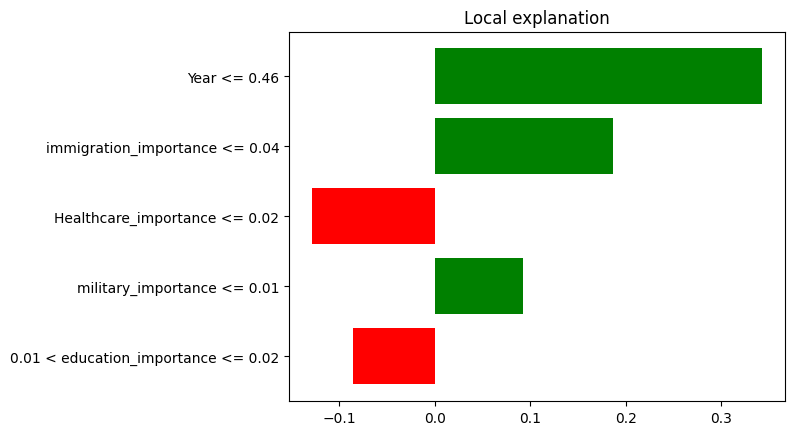

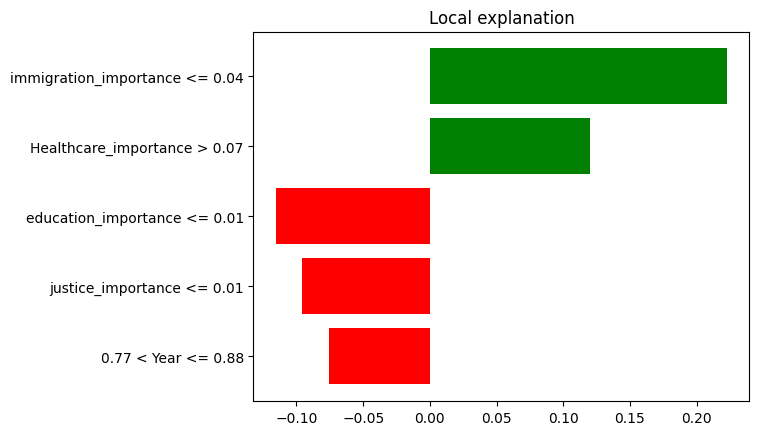

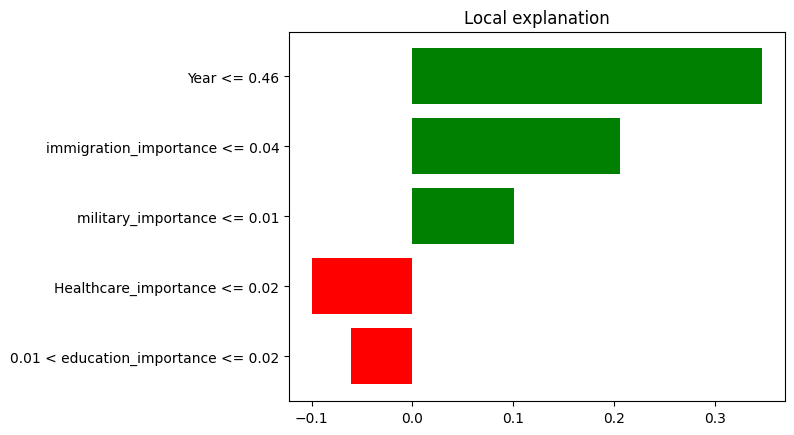

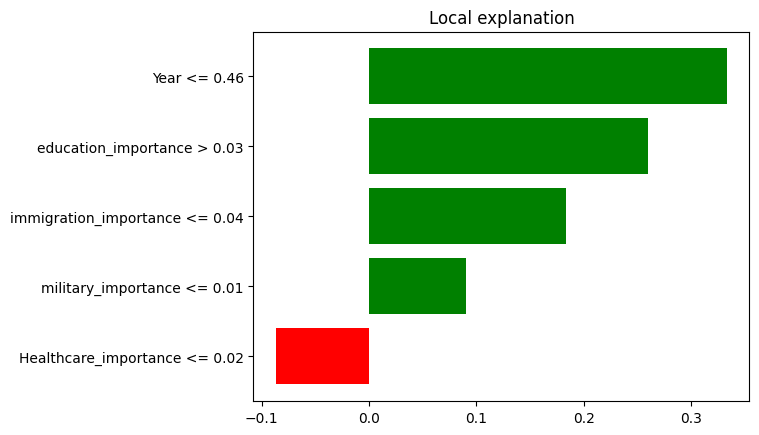

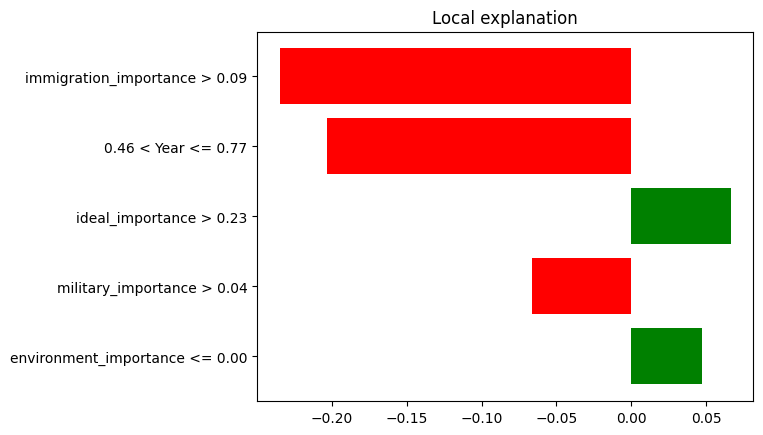

...

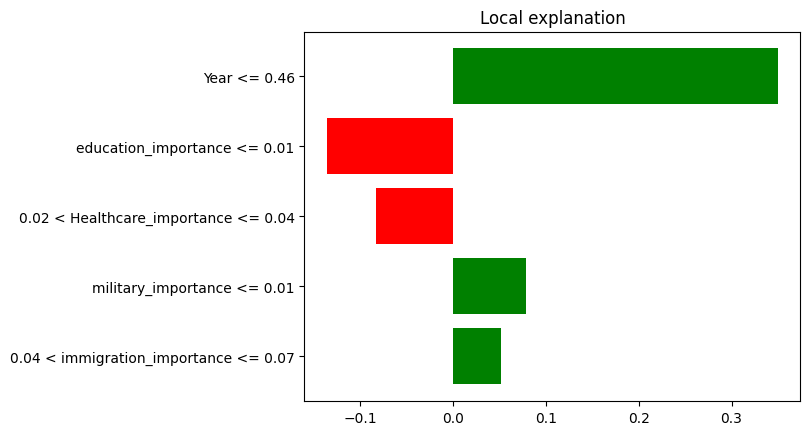

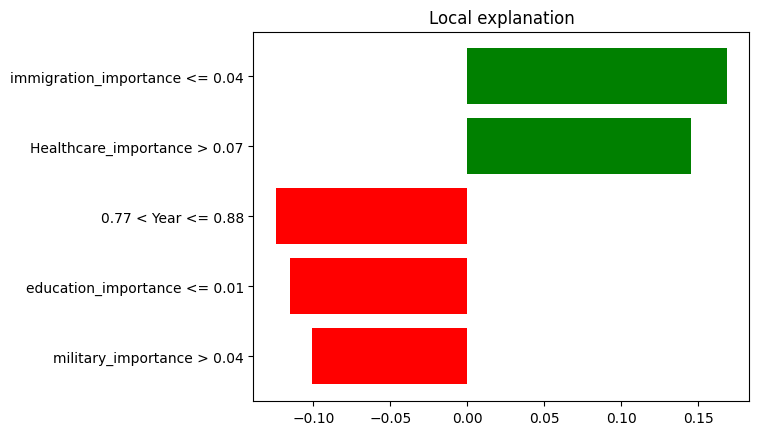

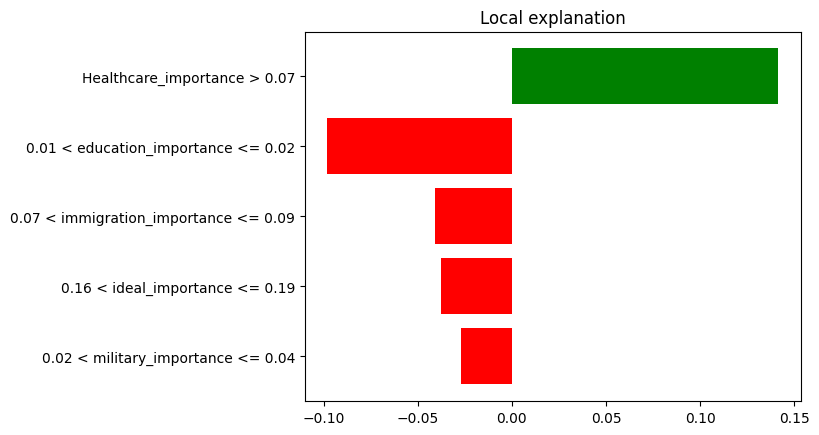

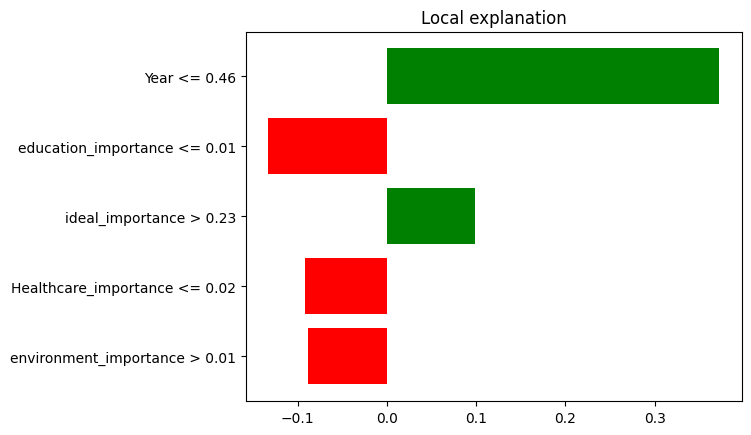

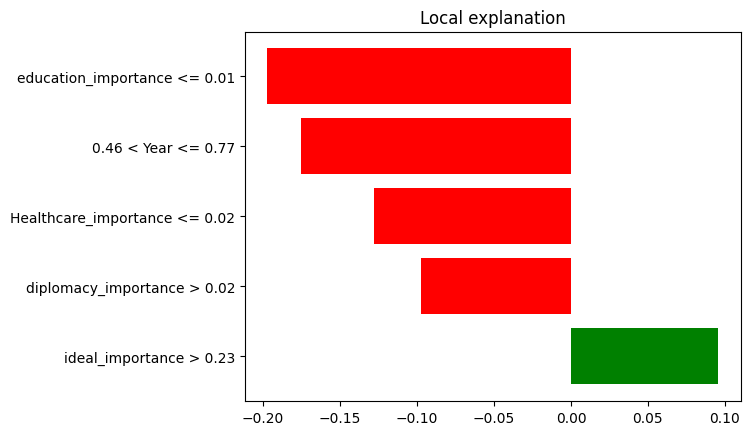

In [105]:
!pip install lime
import lime
import lime.lime_tabular
from lime import lime_image

# explainer = lime_image.LimeImageExplainer()


explainer = lime.lime_tabular.LimeTabularExplainer(combined_importance_x_train, feature_names=importance_columns, mode='regression')

for i in range(len(importance_valid_x)):
    if importance_model.predict(np.expand_dims(importance_valid_x[i],0)).item() >= 0.5 and importance_valid_y[i] == 1:
        explanation = explainer.explain_instance(importance_valid_x[i], importance_model.predict, num_features=5, num_samples=1000)
        # explanation.save_to_file(path+f'lime_bertopic_{i}.html')
        explanation.as_pyplot_figure()
        # explanation.show_in_notebook()